## Exploratory Data Analysis (EDA) 
    Exploratory Data Analysis is all about analysing the dataset and summarizing the key insights and characteristics of the data

## EDA checklist
1. Understanding the dataset, and its shape
2. Checking the data type of each column
3. Categorical and Numerical columns
4. Checking for missing values
5. Descriptive summary of the dataset
6. Groupby for classification problems

## Importing dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import sklearn.datasets

## Data Collection
    Loading the credit risk dataset

In [2]:
dataset = pd.read_csv('credit_risk_dataset.csv')

## Exploratory Data Analysis

In [3]:
# printing the first five rows of the dataframe
dataset.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [4]:
# checking the number of observations 
# how many datapoints are there and how many features are there?
dataset.shape

(32581, 12)

In [5]:
# checking the data types
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [6]:
# checking for missing values
dataset.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [7]:
# dropping the rows with missing values
# imputation to be done late
new_dataset = dataset.dropna()

In [8]:
# checking the remaining number of observations
new_dataset.shape

(28638, 12)

In [9]:
# Loop through each feature to check the number of unique values
for column in dataset:
    uniques_vals = np.unique(dataset[column])
    nr_vals = len(uniques_vals)
    if nr_vals < 36:
        print(
            f"The number of values for feature {column} : {nr_vals} -- {uniques_vals}")
    else:
        print(f"The number of values for feature {column} : {nr_vals}")

The number of values for feature person_age : 58
The number of values for feature person_income : 4295
The number of values for feature person_home_ownership : 4 -- ['MORTGAGE' 'OTHER' 'OWN' 'RENT']
The number of values for feature person_emp_length : 37
The number of values for feature loan_intent : 6 -- ['DEBTCONSOLIDATION' 'EDUCATION' 'HOMEIMPROVEMENT' 'MEDICAL' 'PERSONAL'
 'VENTURE']
The number of values for feature loan_grade : 7 -- ['A' 'B' 'C' 'D' 'E' 'F' 'G']
The number of values for feature loan_amnt : 753
The number of values for feature loan_int_rate : 349
The number of values for feature loan_status : 2 -- [0 1]
The number of values for feature loan_percent_income : 77
The number of values for feature cb_person_default_on_file : 2 -- ['N' 'Y']
The number of values for feature cb_person_cred_hist_length : 29 -- [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30]


### Statistical summary of the data - descriptive statistics

In [10]:
new_dataset.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28638.000000,2.863800e+04,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,6.664937e+04,4.788672,9656.493121,11.039867,0.216600,0.169488,5.793736
std,6.310441,6.235645e+04,4.154627,6329.683361,3.229372,0.411935,0.106393,4.038483
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.948000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.595600e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


### Checking the distribution of the target variable

In [11]:
new_dataset['loan_status'].value_counts()

0    22435
1     6203
Name: loan_status, dtype: int64

In [ ]:
# encoding the categorical columns
# => No need for this step as the target is already in the form of 0's and 1's
# => Just need to encode other categorical columns into 0's and 1's 
label_encode = LabelEncoder()

#labels = label_encode.fit_transform(new_dataset['loan_status'])

#new_dataset['target'] = labels

#new_dataset.drop(columns='loan_status', axis=1, inplace=True)

In [ ]:
new_dataset['target'].value_counts()

   ###### classes
    non-default => 0
    default => 1

###### obervations 
    There is an class imbalance in the dataset, therefore we propose SMOTE. 

###### further distribution
    Grouping the data based on the target

In [13]:
new_dataset.groupby('loan_status').mean()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length
loan_status,,,,,,,
0,27.804636,71237.635569,4.969200,9278.573657,10.463636,0.148247,5.826967
1,27.447203,50054.547477,4.135741,11023.351604,13.123975,0.246311,5.673545


###### observation
    Inference: most of the features, the mean values are higher for non-default cases and lower for default cases

In [14]:
# Converting the categorical columns into numerical values
new_dataset['person_home_ownership'].value_counts()

RENT        14551
MORTGAGE    11801
OWN          2192
OTHER          94
Name: person_home_ownership, dtype: int64

In [15]:
new_dataset['loan_intent'].value_counts()

EDUCATION            5704
MEDICAL              5293
VENTURE              5001
PERSONAL             4877
DEBTCONSOLIDATION    4565
HOMEIMPROVEMENT      3198
Name: loan_intent, dtype: int64

In [16]:
new_dataset['loan_grade'].value_counts()

A    9402
B    9151
C    5699
D    3248
E     870
F     209
G      59
Name: loan_grade, dtype: int64

In [18]:
new_dataset['loan_status'].value_counts()

0    22435
1     6203
Name: loan_status, dtype: int64

In [19]:
new_dataset['cb_person_default_on_file'].value_counts()

N    23535
Y     5103
Name: cb_person_default_on_file, dtype: int64

In [20]:
label_encode = LabelEncoder()
cols = ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file']

for col in cols:
    new_dataset[col] = label_encode.fit_transform(new_dataset[col])


# new_dataset.drop(columns='loan_status', axis=1, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_21652\3591502055.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_dataset[col] = label_encode.fit_transform(new_dataset[col])


In [21]:
new_dataset.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,3,123.0,4,3,35000,16.02,1,0.59,1,3
1,21,9600,2,5.0,1,1,1000,11.14,0,0.10,0,2
2,25,9600,0,1.0,3,2,5500,12.87,1,0.57,0,3
3,23,65500,3,4.0,3,2,35000,15.23,1,0.53,0,2
4,24,54400,3,8.0,3,2,35000,14.27,1,0.55,1,4


In [22]:
new_dataset['person_home_ownership'].value_counts()

3    14551
0    11801
2     2192
1       94
Name: person_home_ownership, dtype: int64

In [23]:
new_dataset['loan_intent'].value_counts()

1    5704
3    5293
5    5001
4    4877
0    4565
2    3198
Name: loan_intent, dtype: int64

In [24]:
new_dataset['loan_grade'].value_counts()

0    9402
1    9151
2    5699
3    3248
4     870
5     209
6      59
Name: loan_grade, dtype: int64

In [25]:
new_dataset['cb_person_default_on_file'].value_counts()

0    23535
1     5103
Name: cb_person_default_on_file, dtype: int64

### Person Home Ownership
    MORTGAGE => 0
    OTHER    => 1
    OWN      => 2
    RENT     => 3

### Loan Intention
    DEBTCONSOLIDATION => 0
    EDUCATION         => 1
    HOMEIMPROVEMENT   => 2
    MEDICAL           => 3
    PERSONAL          => 4
    VENTURE           => 5

### Loan Grade
    A => 0
    B => 1
    C => 2
    D => 3
    E => 4
    F => 5
    G => 6
### cb_person_default_on_file
    N => 0
    Y => 1
### Loan Status
    0 => Non-Default
    1 => Default

### Summary from EDA
1. There were missing values and we removed them
2. We have categorical as well as numerical columns
3. Mean is slightly more than the medium (50%) for most of the features. So, it is right skewed
4. There is an imbalance in the dataset- non-default cases are more than default cases - SMOTE is proposed
5. Mean of most features are clearly larger for non-default cases compared to the default cases

## Data Visualisation

<AxesSubplot:xlabel='loan_status', ylabel='count'>

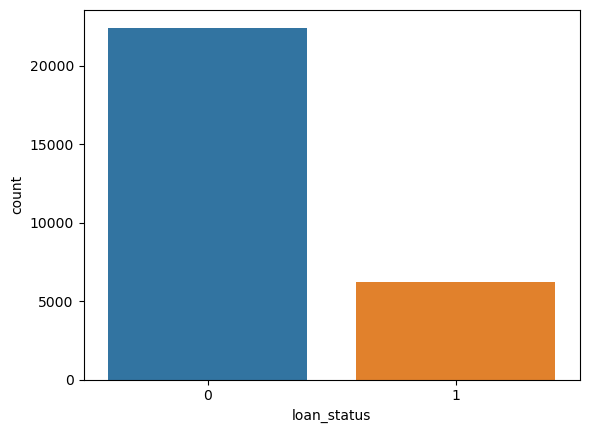

In [26]:
# countplot for the target column for checking the distribution of target
sns.countplot(x='loan_status', data=new_dataset)

###### observation
    Distribution plot for all columns

In [27]:
# this is how we can get all the column names of the dataframe
for column in new_dataset:
    print(column)

person_age
person_income
person_home_ownership
person_emp_length
loan_intent
loan_grade
loan_amnt
loan_int_rate
loan_status
loan_percent_income
cb_person_default_on_file
cb_person_cred_hist_length


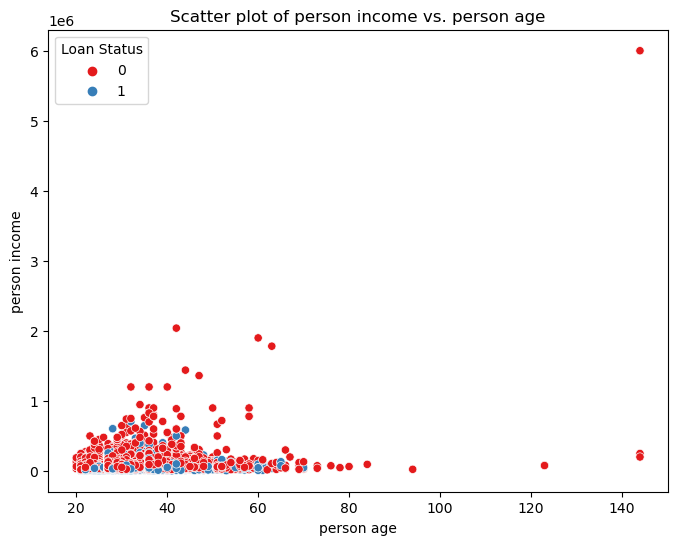

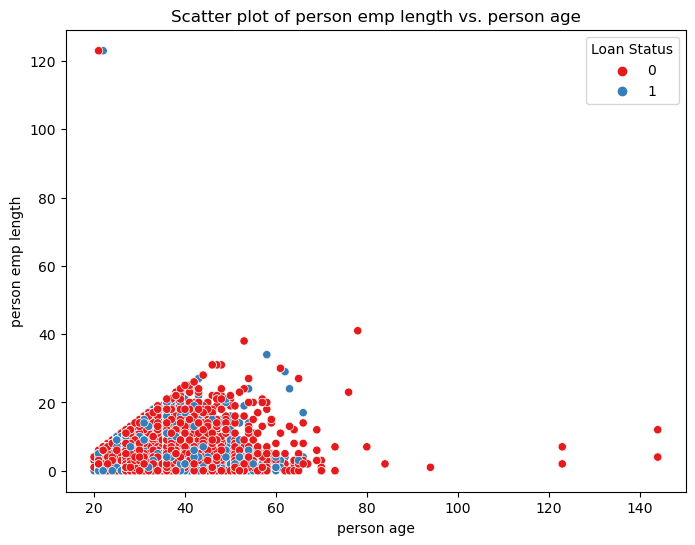

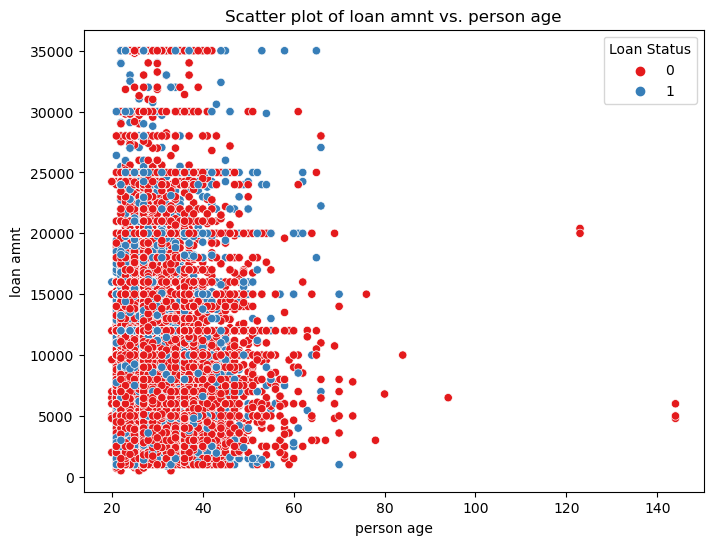

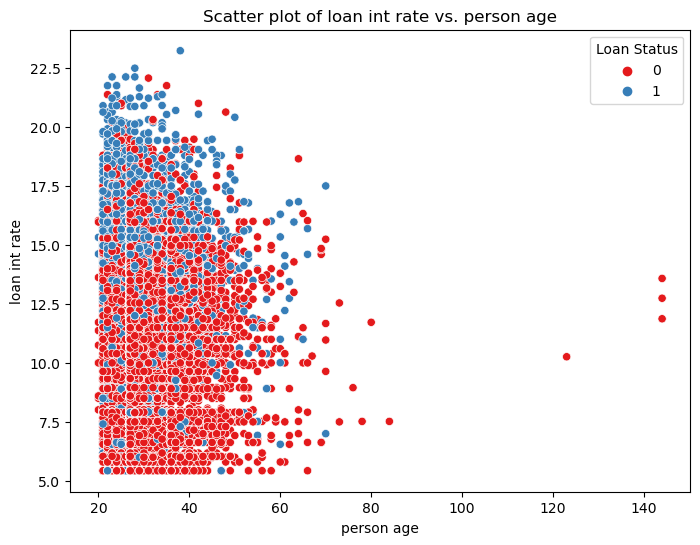

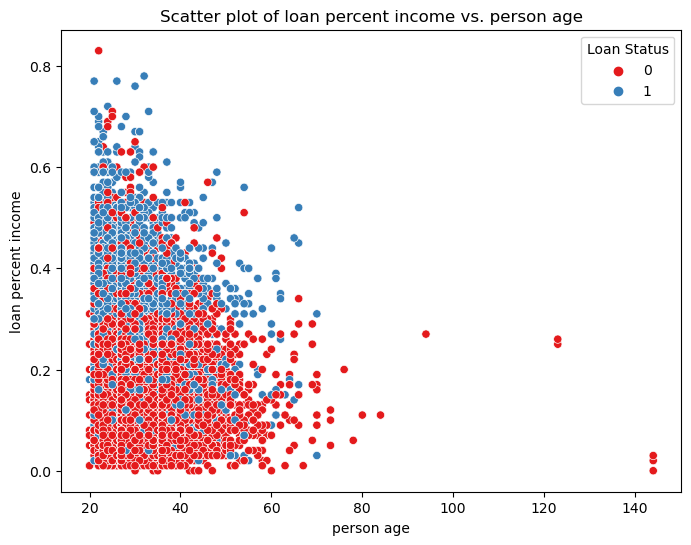

...

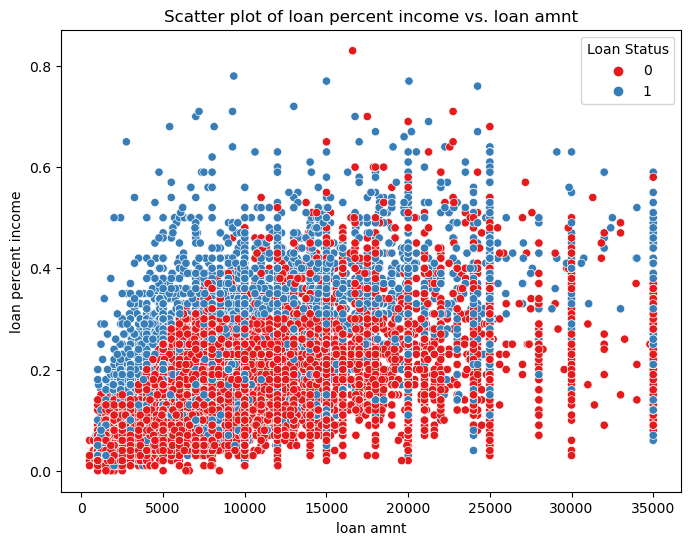

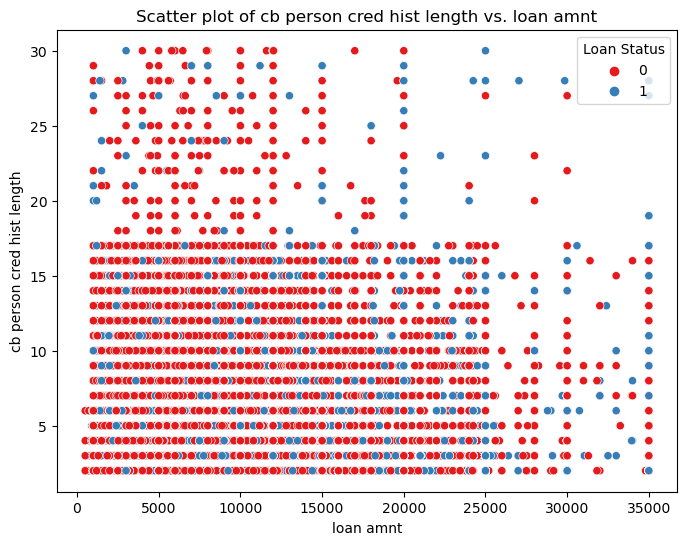

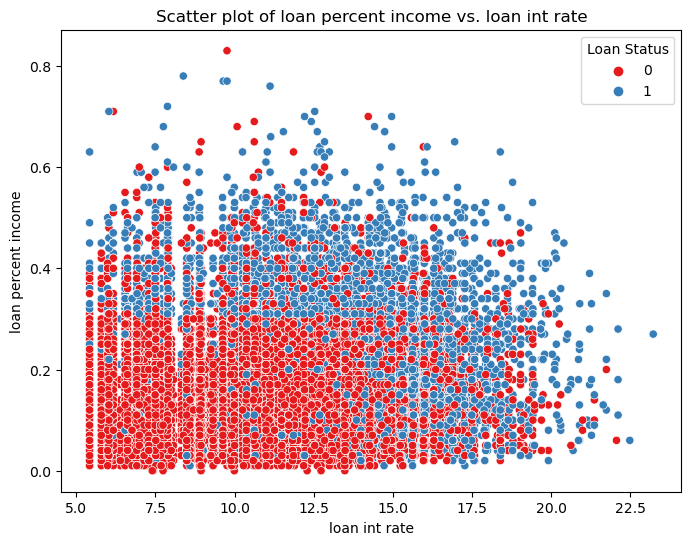

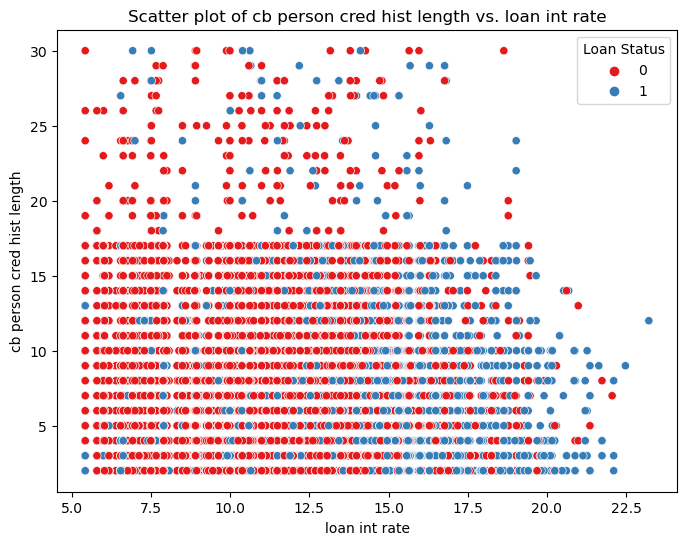

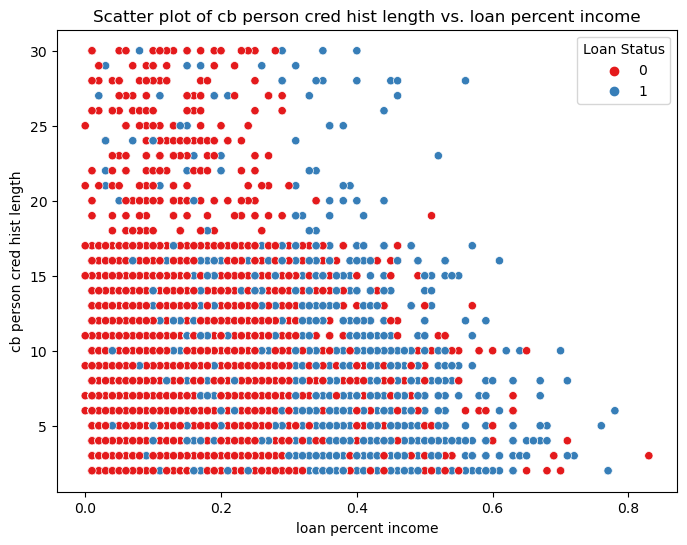

In [34]:
# List of NUMERICAL features
features = ['person_age', 'person_income',
            'person_emp_length', 'loan_amnt',
            'loan_int_rate', 'loan_percent_income',
            'cb_person_cred_hist_length']

# Loop over pairs of features
for i in range(len(features)):
    for j in range(i+1, len(features)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=dataset,
            x=features[i],
            y=features[j],
            hue='loan_status',            # Categorical variable for shading
            palette='Set1'                # Color palette for shading
        )
        plt.title(f'Scatter plot of {features[j].replace("_", " ")} vs. {features[i].replace("_", " ")}')
        plt.xlabel(features[i].replace("_", " "))
        plt.ylabel(features[j].replace("_", " "))
        plt.legend(title='Loan Status')
        plt.show()

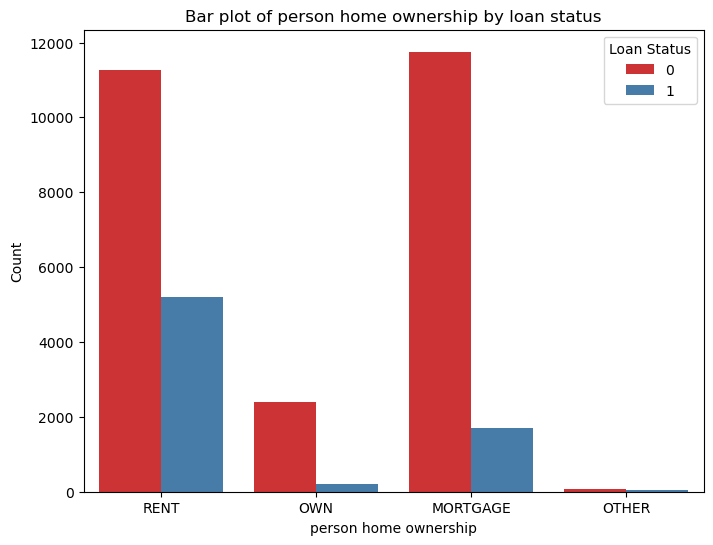

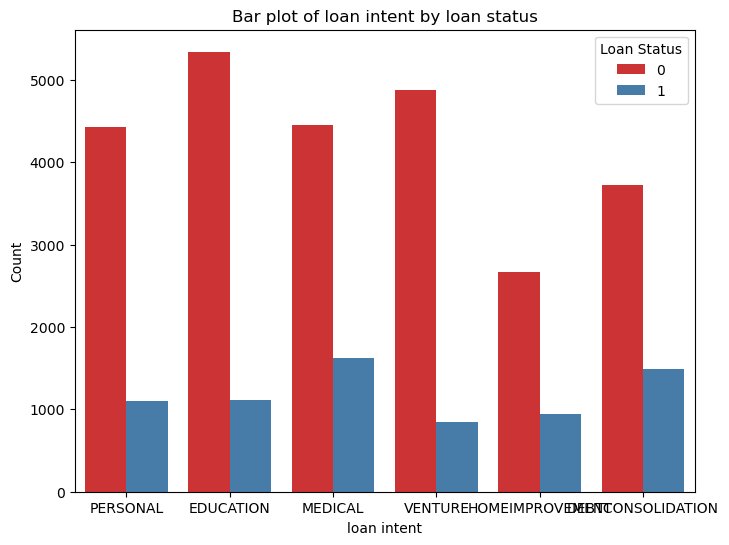

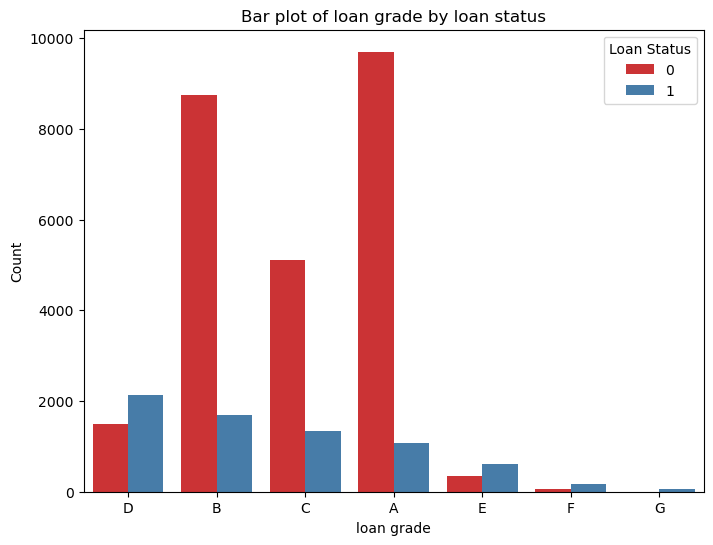

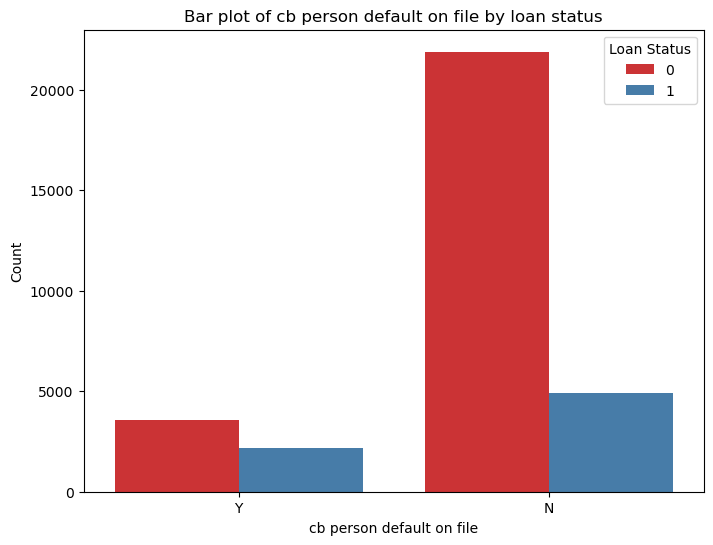

In [6]:
# List of categorical features (adjust based on your data)
categorical_features = ['person_home_ownership', 'loan_intent',
                        'loan_grade', 'cb_person_default_on_file']

# Generate bar plots for each categorical feature
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.countplot(
        data=dataset,
        x=feature,
        hue='loan_status',           # Splits counts by loan status outcome
        palette='Set1'               # Color palette for the outcome categories
    )
    plt.title(f'Bar plot of {feature.replace("_", " ")} by loan status')
    plt.xlabel(feature.replace("_", " "))
    plt.ylabel('Count')
    plt.legend(title='Loan Status')
    plt.show()

In [ ]:
# creating a for loop to get the distribution plot for all columns
for column in new_dataset:
    sns.displot(x=column, data=new_dataset, bins=60)

##### Skewness
- It is observed that our dataset is rightly skewed. 
- So, if you give your model a data point that lies in the tail the model cannot predict properly. 
- The reason is that it does not have much data to learn from the region (tail).

#### Problem associated with a skewed dataset
- The problem with skewness is that whenever you are using a regression model, the model has a basic assumption that the data is normally distributed. 
- Therefore whenever you come across with skewness, you have to transform the data. 
- Methods that can be used to transform include the log transform
- But some other methods are not affected such as random forest, decision trees, and etc

In [ ]:
# get distribution plot for each variable
sns.distplot(x=new_dataset.person_age)

###### observation
    Inference about the distribution: most of the features are right skewed.

#### Pair plots
- takes time if we have many features
- taking random sample of the dataset is preferred to make the pairplot

In [ ]:
# pair plot
# sns.pairplot(new_dataset)
# plt.show()

###### below
    Scatter plot of first two columns

In [ ]:
# select first column of the dataframe as a series
first_column = new_dataset.iloc[:, 0]

# select second column of the dataframe as a series
second_column = new_dataset.iloc[:, 1]

In [ ]:
# plot the scatter plot of the first and second columns
plt.scatter(x=first_column, y=second_column)

##### Outlier detection
Box plot for visualizing the outliers in the dataset
Outlier can be a mistake or natural. 
But it is important to handle outliers as regression models are sensitive to outliers.

In [ ]:
for column in new_dataset:
    plt.figure()
    new_dataset.boxplot([column])

###### observation
    As we can see that most of the skewed features have outliers

###### Correlation Matrix

In [55]:
# Creating a mapping from original feature names to shortened names
feature_names = new_dataset.columns
shortened_names = {original: f"X{i+1}" for i, original in enumerate(feature_names)}

# Rename columns for the heatmap
df_shortened = new_dataset.rename(columns = shortened_names)

# Check if the names are shortened correctly
df_shortened.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12
0,22,59000,3,123.0,4,3,35000,16.02,1,0.59,1,3
1,21,9600,2,5.0,1,1,1000,11.14,0,0.10,0,2
2,25,9600,0,1.0,3,2,5500,12.87,1,0.57,0,3
3,23,65500,3,4.0,3,2,35000,15.23,1,0.53,0,2
4,24,54400,3,8.0,3,2,35000,14.27,1,0.55,1,4


In [56]:
corr_matrix = df_shortened.corr()

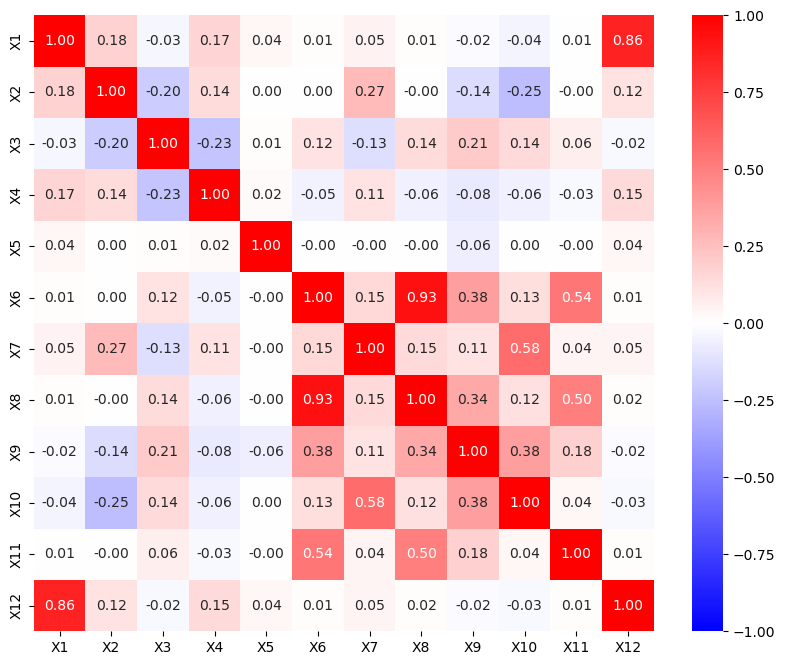

In [59]:
# Constructing a heatmap to visualize the correlation matrix
plt.figure(figsize = (10, 8))
sns.heatmap(corr_matrix, cbar = True, fmt = '.2f', annot = True, cmap = 'bwr', vmin=-1, vmax=1)
plt.savefig('Correlation Heatmap')

In [61]:
# Checking if the output variable is correlated to the independent variables
# Pearson correlation coefficient
corr = new_dataset.corr()["loan_status"].sort_values(ascending = True)[1:]

# absolute for positive values
abs_corr = abs(corr)

# random threshold for features to keep
relevant_features = abs_corr
relevant_features

person_emp_length             0.082638
loan_intent                   0.064628
person_age                    0.023333
cb_person_cred_hist_length    0.015649
loan_amnt                     0.113550
cb_person_default_on_file     0.182019
person_home_ownership         0.208532
loan_int_rate                 0.339350
loan_grade                    0.379683
loan_percent_income           0.379689
loan_status                   1.000000
Name: loan_status, dtype: float64

In [63]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression, LinearRegression

In [66]:
# Input and output features
from sklearn.model_selection import train_test_split
X = new_dataset.drop('loan_status', axis=1)
y = new_dataset['loan_status']



# defining model to build
log_reg = LogisticRegression()

# create the RFE model and select 6 attributes
rfe = RFE(log_reg)
rfe.fit(X, y)

# summarise the selection of the attributes
print(f"Number of selected features: {rfe.n_features_}")
print(f"Mask: {rfe.support_}")
print(f"Selected Features: {[feature for feature, rank in zip(X.columns.values, rfe.ranking_) if rank == 1]}")
print(f"Estimator: {rfe.estimator_}")

Number of selected features: 5
Mask: [ True  True False False False  True  True  True False False False]
Selected Features: ['person_age', 'person_income', 'loan_grade', 'loan_amnt', 'loan_int_rate']
Estimator: LogisticRegression()


In [67]:
# feature selection using LASSO
from sklearn.linear_model import Lasso
lasso = Lasso()
lasso.fit(X, y)

# perform feature selection
kept_columns = [feature for feature, weight in zip(X.columns.values, lasso.coef_) if weight != 0]
print(f"Selected Features: {kept_columns}")

Selected Features: ['person_income', 'loan_amnt']


In [71]:
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# random data:
X = X
y = y

selector = SelectKBest(k=1)

# first select features
X_selected = selector.fit_transform(X,y)

# then split
X_selected_train, X_selected_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.30, random_state=42)

# fit a simple logistic regression
lr = LogisticRegression()
lr.fit(X_selected_train,y_train)

# predict on the test set and get the test accuracy:
y_pred = lr.predict(X_selected_test)
accuracy_score(y_test, y_pred)

0.8102886405959032

In [73]:
# split first
# X = new_dataset[['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# then select features using the training set only
k = 5
selector = SelectKBest(k=k)
X_train_selected = selector.fit_transform(X_train,y_train)

# fit again a simple logistic regression
lr.fit(X_train_selected,y_train)

# select the same features on the test set, predict, and get the test accuracy:
X_test_selected = selector.transform(X_test)
y_pred = lr.predict(X_test_selected)
accuracy_score(y_test, y_pred)

# feature_names = list(features_dataframe.columns.values)
feature_names = list(X.columns.values)
# Extract the required features
new_features  = selector.get_feature_names_out(feature_names)
print(f"Selected features: {new_features}")

Selected features: ['person_home_ownership' 'loan_grade' 'loan_int_rate'
 'loan_percent_income' 'cb_person_default_on_file']


###### Multicollinearity problem:
- Multicollinearity exists when an independent variable is highly correlated with one or more independent variables
- We can remove the features if they have high positive or negative correlation between them

##### Inference from EDA and Data Visualization
1. We had missing values and removed rows with missing values. Proposing imputation. 
2. We had categorical values and we encoded them into numerical formats using LabelEncoder from sklearn.
3. Mean is greater than median for most features. So, it is positively skewed.
4. The dataset is imbalance, SMOTE is proposed to balance the dataset.
5. Mean of most features are clearly larger for non-default cases compared to default cases.
6. Most of the features have outliers.
7. Correlation matrix reveal that some of the features are correlated to each other. So, removing certain features during Feature Selecton might help the regression model learn efficiently. 

In [75]:
# Generate a pandas report to get summary of the EDA
from pandas_profiling import ProfileReport
report = ProfileReport(new_dataset)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]